In [1]:
# Data Storytelling in pattern recognition

## Data Exploration

In [2]:
pip install a-world-of-countries

^C
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install vega_datasets

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install "vegafusion[embed]"

In [2]:
#importing libraries

import awoc
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
from matplotlib import pyplot as plt
%matplotlib inline
import datetime as dt
import plotly.graph_objects as go
import altair as alt
from vega_datasets import data
import geopandas as gpd
import warnings
warnings.filterwarnings('ignore')

In [3]:
# loading dataset

afri_prod = pd.read_csv("C:/Users/ADONAI-MKSHALOM/Desktop/Pola/DA/Hamoye/Africa_Food_Production.csv")

In [4]:
# Investigating the dataset
afri_prod.head()

,Country,Item,Year,Value
0,Algeria,Wheat and products,2004,2731
1,Algeria,Wheat and products,2005,2415
2,Algeria,Wheat and products,2006,2688
3,Algeria,Wheat and products,2007,2319
4,Algeria,Wheat and products,2008,1111


In [5]:
afri_prod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23110 entries, 0 to 23109
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Country  23110 non-null  object
 1   Item     23110 non-null  object
 2   Year     23110 non-null  int64 
 3   Value    23110 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 722.3+ KB


In [6]:
afri_prod.describe()

,Year,Value
count,23110.000000,23110.000000
mean,2008.498269,327.785201
std,2.871740,1607.940343
min,2004.000000,0.000000
25%,2006.000000,3.000000
50%,2008.000000,18.000000
75%,2011.000000,108.000000
max,2013.000000,54000.000000


In [7]:
# Checking for unique values

afri_prod['Country'].nunique()

45

In [8]:
afri_prod['Item'].nunique()

94

In [9]:
afri_prod['Year'].nunique()

10

In [10]:
afri_prod['Value'].nunique()

2134

In [11]:
afri_prod['Country'].unique()

array(['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso',
       'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad',
       'Congo', "Cote d'Ivoire", 'Djibouti', 'Egypt', 'Ethiopia', 'Gabon',
       'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho',
       'Liberia', 'Madagascar', 'Malawi', 'Mali', 'Mauritania',
       'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger',
       'Nigeria', 'Rwanda', 'Sao Tome and Principe', 'Senegal',
       'Sierra Leone', 'South Africa', 'Sudan', 'Swaziland', 'Togo',
       'Tunisia', 'Uganda', 'United Republic of Tanzania', 'Zambia',
       'Zimbabwe'], dtype=object)

In [12]:
afri_prod['Item'].unique()

array(['Wheat and products', 'Rice (Milled Equivalent)',
       'Barley and products', 'Maize and products', 'Oats',
       'Sorghum and products', 'Cereals, Other', 'Potatoes and products',
       'Sugar beet', 'Sugar (Raw Equivalent)', 'Honey', 'Beans', 'Peas',
       'Pulses, Other and products', 'Nuts and products',
       'Groundnuts (Shelled Eq)', 'Sunflower seed',
       'Rape and Mustardseed', 'Cottonseed',
       'Olives (including preserved)', 'Groundnut Oil',
       'Sunflowerseed Oil', 'Rape and Mustard Oil', 'Olive Oil',
       'Oilcrops Oil, Other', 'Tomatoes and products', 'Onions',
       'Vegetables, Other', 'Oranges, Mandarines',
       'Lemons, Limes and products', 'Grapefruit and products',
       'Citrus, Other', 'Bananas', 'Apples and products', 'Dates',
       'Grapes and products (excl wine)', 'Fruits, Other', 'Pimento',
       'Wine', 'Beer', 'Beverages, Alcoholic', 'Bovine Meat',
       'Mutton & Goat Meat', 'Pigmeat', 'Poultry Meat', 'Meat, Other',
       'Of

In [13]:
afri_prod['Item'].nunique()

94

In [14]:
# Converting dates to dateobject and adding unit and creating kt unit of values

afri_prod['Year'] = pd.to_datetime(afri_prod.Year, format = '%Y').dt.year
afri_prod['Unit'] = 'kt'

In [15]:
afri_prod.head()

,Country,Item,Year,Value,Unit
0,Algeria,Wheat and products,2004,2731,kt
1,Algeria,Wheat and products,2005,2415,kt
2,Algeria,Wheat and products,2006,2688,kt
3,Algeria,Wheat and products,2007,2319,kt
4,Algeria,Wheat and products,2008,1111,kt


In [16]:
# Grouping all entities by countries, by year, and by item

group_prod = afri_prod.groupby(['Country','Year', 'Item'])['Value'].sum()

In [17]:
group_prod

Country   Year  Item                 
Algeria   2004  Apples and products       165
                Bananas                     0
                Barley and products      1212
                Beans                       2
                Beer                      110
                                         ... 
Zimbabwe  2013  Tea (including mate)       19
                Tomatoes and products      24
                Vegetables, Other         203
                Wheat and products         25
                Wine                        2
Name: Value, Length: 23110, dtype: int64

In [16]:
# Data exploration

# check the food production trend in Africa

In [ ]:
# Checking for mean, median, outliers, and quantiles

In [53]:
print(afri_prod['Year'].mean())
print(afri_prod['Value'].mean())

2008.4982691475552
327.7852012115967


In [54]:
print(afri_prod['Year'].median())
print(afri_prod['Value'].median())

2008.0
18.0


In [65]:
q1 = afri_prod['Value'].quantile(0.25)
q1

3.0

In [66]:
q3 = afri_prod['Value'].quantile(0.75)
q3

108.0

In [67]:
iqr = q3 - q1
iqr

105.0

In [70]:
# checking for outliers

#checking at upper fence
afri_prod[afri_prod.Value > (q3 + (1.5 * iqr))].any()

Country    True
Item       True
Year       True
Value      True
Unit       True
dtype: bool

In [72]:
#checking at lower fence
afri_prod[afri_prod.Value < (q1 - (1.5 * iqr))].any()

Country    False
Item       False
Year       False
Value      False
Unit       False
dtype: bool

In [73]:
# countries whose value is higher than the upper fence
afri_prod[afri_prod.Value > (q1 + (1.5 * iqr))]

,Country,Item,Year,Value,Unit
0,Algeria,Wheat and products,2004,2731,kt
1,Algeria,Wheat and products,2005,2415,kt
2,Algeria,Wheat and products,2006,2688,kt
3,Algeria,Wheat and products,2007,2319,kt
4,Algeria,Wheat and products,2008,1111,kt
...,...,...,...,...,...
23085,Zimbabwe,Milk - Excluding Butter,2009,389,kt
23086,Zimbabwe,Milk - Excluding Butter,2010,396,kt
23087,Zimbabwe,Milk - Excluding Butter,2011,400,kt
23088,Zimbabwe,Milk - Excluding Butter,2012,410,kt


In [76]:
# creating dataframe
outlier_countries = pd.DataFrame(afri_prod[afri_prod.Value > (q1 + (1.5 * iqr))])

In [77]:
outlier_countries['Country'].nunique()

39

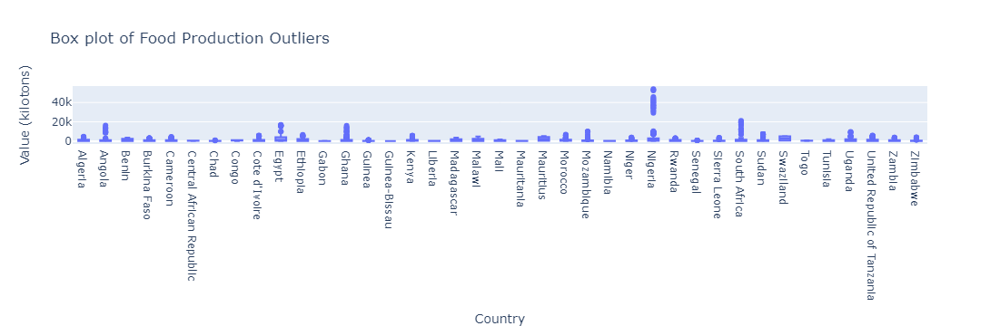

In [78]:
# visualizing the outlier countries with plotly(box plot)

px.box(outlier_countries, x = 'Country', y = 'Value', title = 'Box plot of Food Production Outliers',
        labels = {'Country': 'Country', 'Value':'Value (kilotons)'})

In [18]:
afri_prod['Year'].sort_values(ascending = False)

23109    2013
17349    2013
4739     2013
17409    2013
4749     2013
         ... 
4560     2004
17630    2004
17640    2004
4550     2004
0        2004
Name: Year, Length: 23110, dtype: int32

In [21]:
# Check the 2004 production trend in Africa

prod_2004 = afri_prod[afri_prod['Year'] == 2004]
prod_2004

,Country,Item,Year,Value,Unit
0,Algeria,Wheat and products,2004,2731,kt
10,Algeria,Rice (Milled Equivalent),2004,0,kt
20,Algeria,Barley and products,2004,1212,kt
30,Algeria,Maize and products,2004,1,kt
40,Algeria,Oats,2004,89,kt
...,...,...,...,...,...
23060,Zimbabwe,"Fats, Animals, Raw",2004,7,kt
23070,Zimbabwe,Eggs,2004,25,kt
23080,Zimbabwe,Milk - Excluding Butter,2004,405,kt
23090,Zimbabwe,Freshwater Fish,2004,13,kt


In [33]:
country_total_prod = prod_2004.groupby('Country')['Value'].sum().reset_index()
country_total_prod.sort_values(by = 'Value', ascending = False).head()

,Country,Value
31,Nigeria,149857
12,Egypt,75989
36,South Africa,54949
41,Uganda,31819
37,Sudan,28646


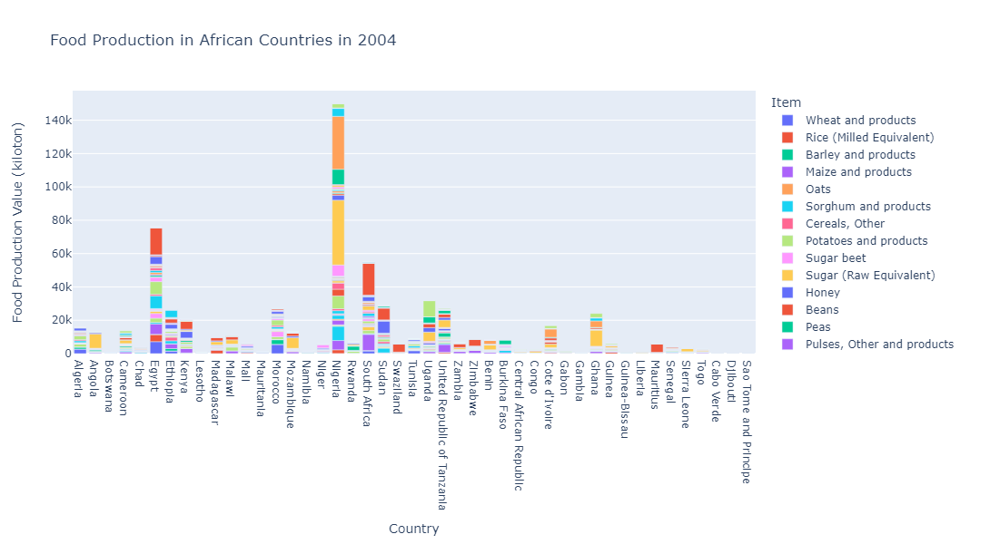

In [35]:
fig = px.bar(
    prod_2004,
    x='Country',
    y='Value',
    color='Item',
    title='Food Production in African Countries in 2004',
    labels={'Value': 'Food Production Value (kiloton)', 'Country': 'Country'}
)

fig.update_layout(
    xaxis_title='Country',
    yaxis_title='Food Production Value (kiloton)',
    legend_title_text='Item',
    width=1000,
    height=600
)

In [19]:
prod_2013 = afri_prod[afri_prod['Year'] == 2013]

In [20]:
prod_2013

,Country,Item,Year,Value,Unit
9,Algeria,Wheat and products,2013,3299,kt
19,Algeria,Rice (Milled Equivalent),2013,0,kt
29,Algeria,Barley and products,2013,1499,kt
39,Algeria,Maize and products,2013,1,kt
49,Algeria,Oats,2013,113,kt
...,...,...,...,...,...
23069,Zimbabwe,"Fats, Animals, Raw",2013,7,kt
23079,Zimbabwe,Eggs,2013,30,kt
23089,Zimbabwe,Milk - Excluding Butter,2013,410,kt
23099,Zimbabwe,Freshwater Fish,2013,18,kt


In [32]:
country_total_prod = prod_2013.groupby('Country')['Value'].sum().reset_index()
country_total_prod.sort_values(by = 'Value', ascending = False).head()

,Country,Value
31,Nigeria,179631
12,Egypt,95848
36,South Africa,63263
13,Ethiopia,46102
42,United Republic of Tanzania,40849


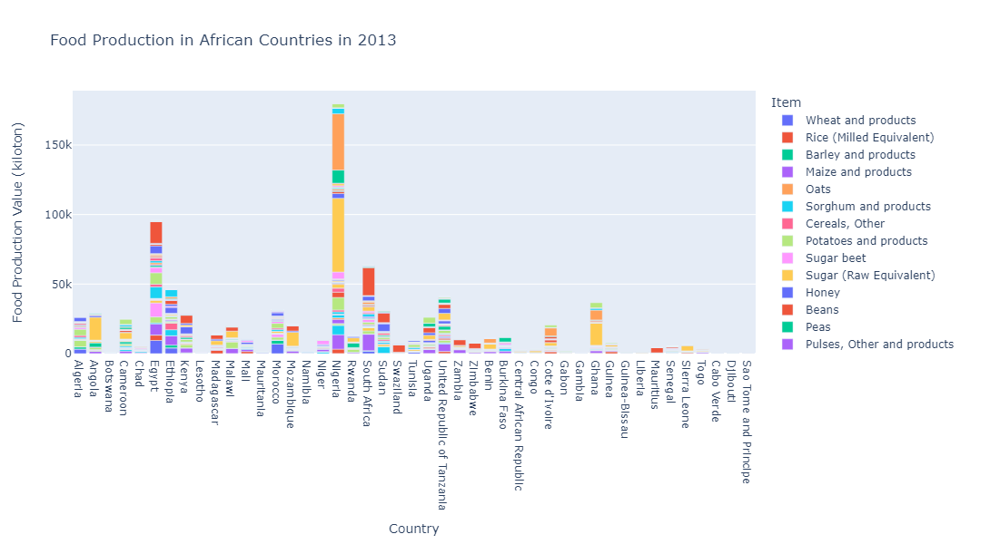

In [24]:
fig = px.bar(
    prod_2013,
    x='Country',
    y='Value',
    color='Item',
    title='Food Production in African Countries in 2013',
    labels={'Value': 'Food Production Value (kiloton)', 'Country': 'Country'}
)

fig.update_layout(
    xaxis_title='Country',
    yaxis_title='Food Production Value (kiloton)',
    legend_title_text='Item',
    width=1000,
    height=600
)

In [ ]:
# From the graphs above, the African food production generally increased from around 149857 kilotons in 2004, to around 179631 kilotons in 2013.

In [34]:
highest_prod_country = afri_prod.groupby('Country')['Value'].sum().idxmax()
highest_prod_country

'Nigeria'

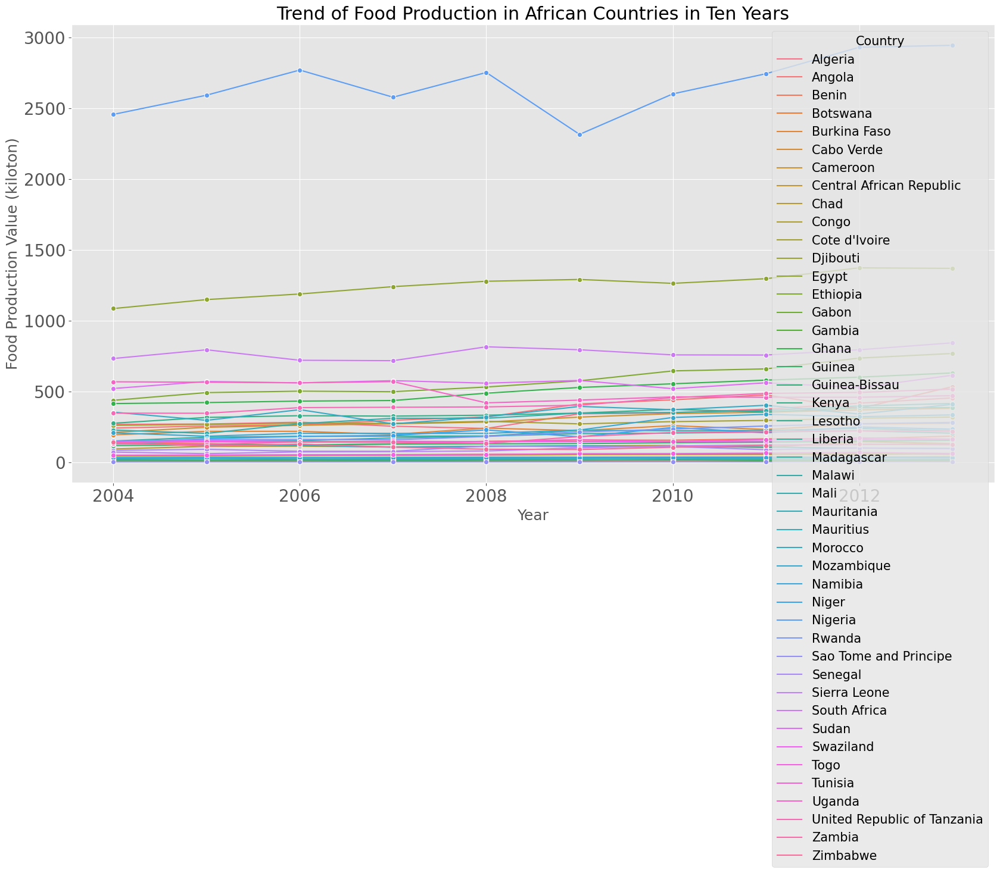

In [146]:
# Line plot showing the food production value over the years

plt.figure(figsize=(20,10))
sns.lineplot(x = 'Year', y = 'Value', data = afri_prod, hue = 'Country', marker = 'o', errorbar = None)
plt.title('Trend of Food Production in African Countries in Ten Years')
plt.xlabel('Year')
plt.ylabel('Food Production Value (kiloton)')
plt.legend(title='Country')
plt.show()

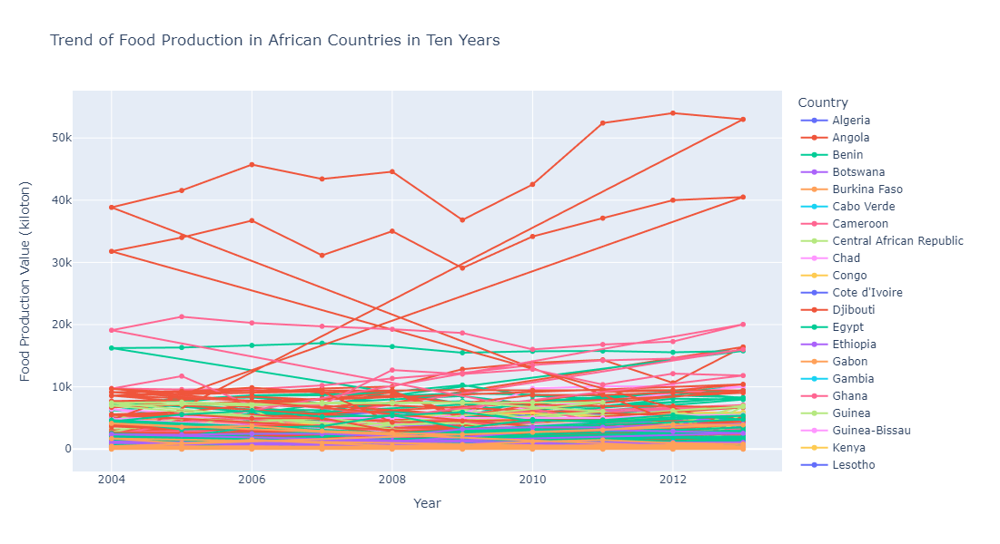

In [145]:
# For an interactive visual

fig = px.line(
    afri_prod,
    x='Year',
    y='Value',
    color='Country',
    markers=True,
    title='Trend of Food Production in African Countries in Ten Years',
    labels={'Year': 'Year', 'Value': 'Food Production Value (kiloton)'},
)

# Update layout for better readability
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Food Production Value (kiloton)',
    legend_title_text='Country',
    width=1000,
    height=600
)

# Show the interactive plot
fig.show()

In [ ]:
# Nigeria is seen as the highest producing country in the above visual.

In [26]:
# Visualizing the yearly trend using Altair

In [21]:
alt.data_transformers.enable("vegafusion")

DataTransformerRegistry.enable('vegafusion')

In [22]:
chart = alt.Chart(afri_prod)

chart = chart.mark_line().encode(
    x='Year:N',  
    y='Value:Q',  
    color='Country:N',
    tooltip=['Year', 'Value', 'Country']
)

chart.properties(
    title='Trend of Food Production in African Countries in Ten Years',
    width=800,  
    height=400
)


alt.Chart(...)

Text(0, 0.5, 'Food Production Value')

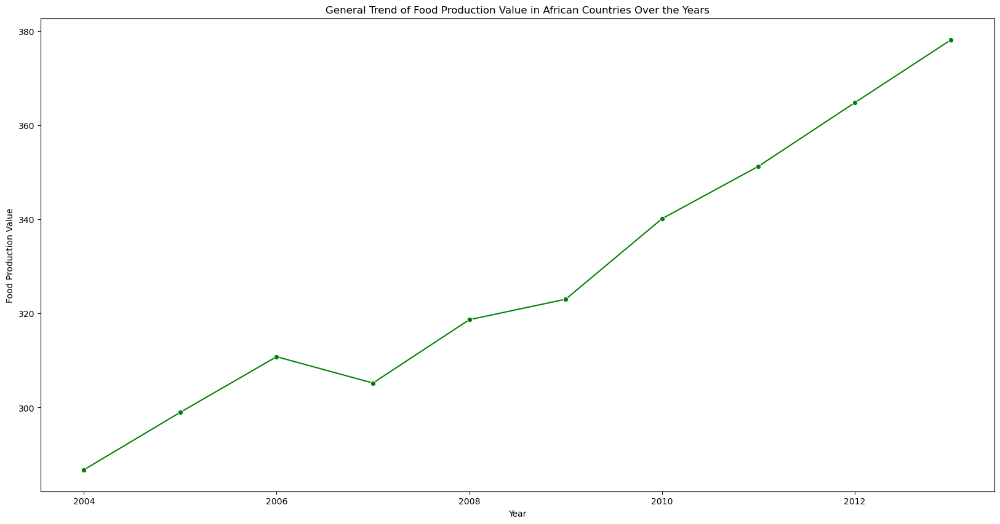

In [29]:
yearly_data = afri_prod.groupby('Year').agg({'Value': 'mean'}).reset_index()

plt.figure(figsize=(20,10))
sns.lineplot(x='Year', y='Value', data=yearly_data, marker='o', color = 'g')
plt.title('General Trend of Food Production Value in African Countries Over the Years')
plt.xlabel('Year')
plt.ylabel('Food Production Value')

In [30]:
# The food production in Africa experience upward trend from 2004 to 2006, before it dipped again in 2007. Afterwards, an upward it experienced an
# trend from 2007 to 2013 as seen in the graph above.

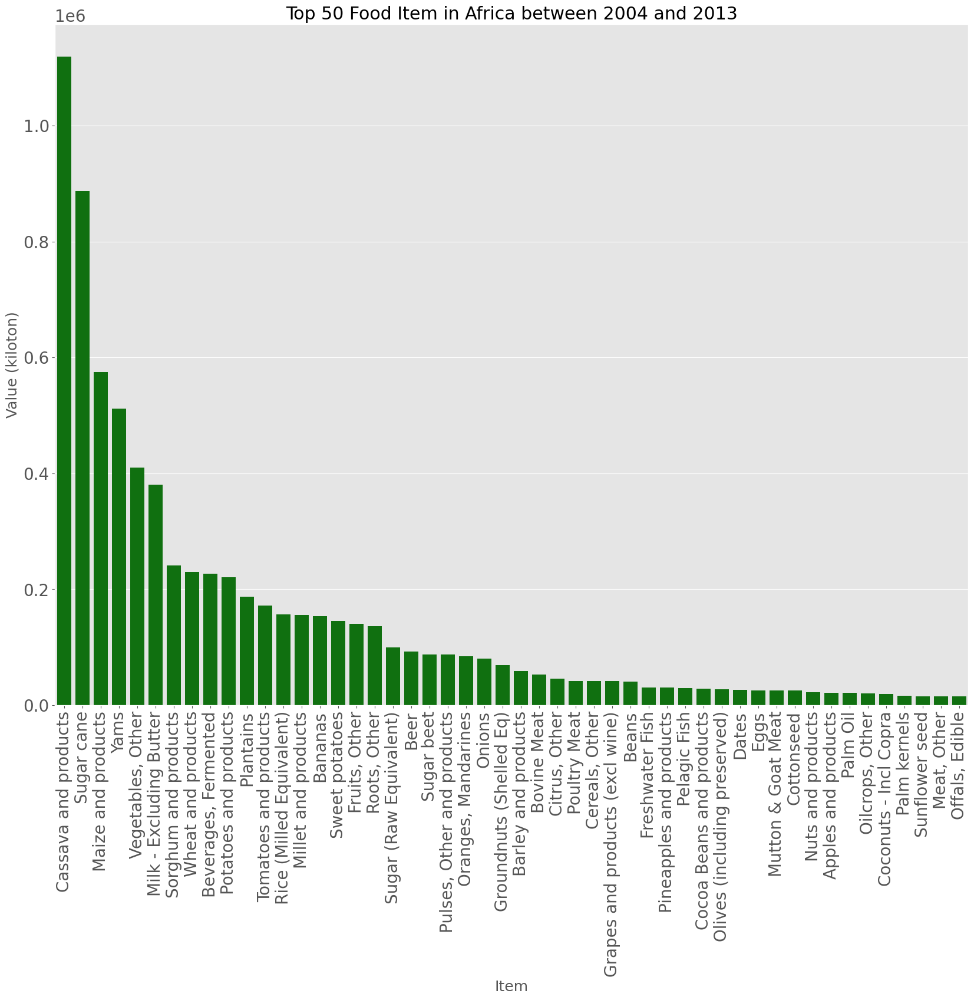

In [23]:
# Let's see the top 50 produced food in Africa

plt.style.use("ggplot")
plt.rc('font', size=15)
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)

# create a pandas dataframe with the Item and Values coulmns
top_50 = pd.DataFrame(afri_prod.groupby('Item')['Value'].sum().sort_values(ascending = False)).reset_index()[:50]

plt.rcParams['figure.figsize'] = (20, 15)
sns.barplot(y = top_50.Value, x = top_50.Item, data = top_50, color = 'g')
plt.gca().set_title("Top 50 Food Item in Africa between 2004 and 2013")
plt.ylabel('Value (kiloton)')
plt.xlabel('Item')
plt.xticks(rotation = 90)
plt.show()

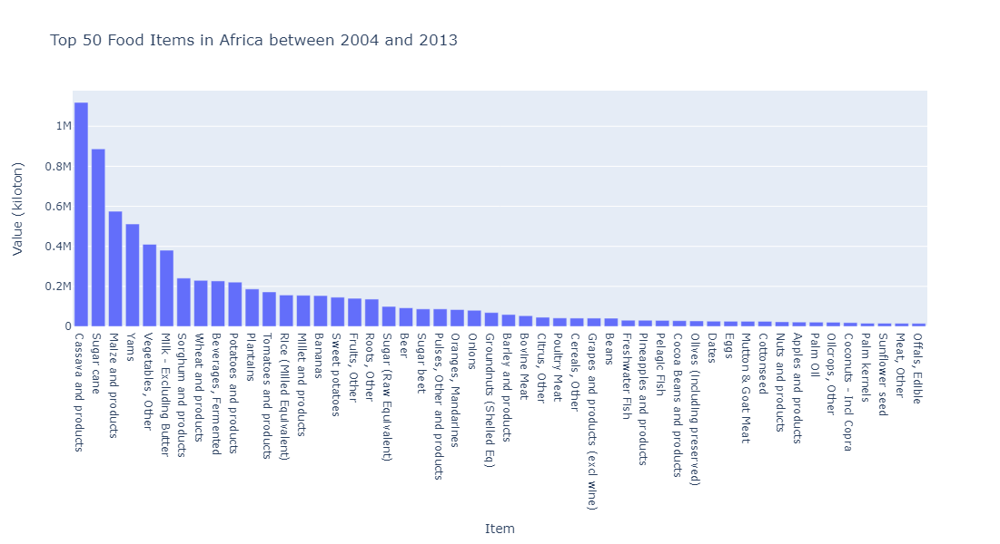

In [36]:
top_50 = afri_prod.groupby('Item')['Value'].sum().sort_values(ascending=False).head(50).reset_index()

# Creating an interactive bar plot using Plotly Express
fig = px.bar(
    top_50,
    x='Item',
    y='Value',
    title='Top 50 Food Items in Africa between 2004 and 2013',
    labels={'Value': 'Value (kiloton)', 'Item': 'Item'}
)

fig.update_layout(
    xaxis_title='Item',
    yaxis_title='Value (kiloton)',
    width=1000,
    height=600
)
fig.show()

In [ ]:
# What are the countries responsible for producing the top 3 food items?

In [38]:
# Grouping and filtering for countries producing the top 3 food items

top_3_food = afri_prod.groupby('Item')['Value'].sum().nlargest(3).index
top_food_data = afri_prod[afri_prod['Item'].isin(top_3_food)]
top_food_by_country = top_food_data.groupby(['Country', 'Item'])['Value'].sum().reset_index()
top_food_by_country.sort_values(by = 'Value', ascending = False)

,Country,Item,Value
77,Nigeria,Cassava and products,452881
92,South Africa,Sugar cane,188396
32,Egypt,Sugar cane,160973
40,Ghana,Cassava and products,121026
1,Angola,Cassava and products,114286
...,...,...,...
0,Algeria,Maize and products,12
65,Mauritius,Cassava and products,3
66,Mauritius,Maize and products,2
29,Djibouti,Maize and products,0


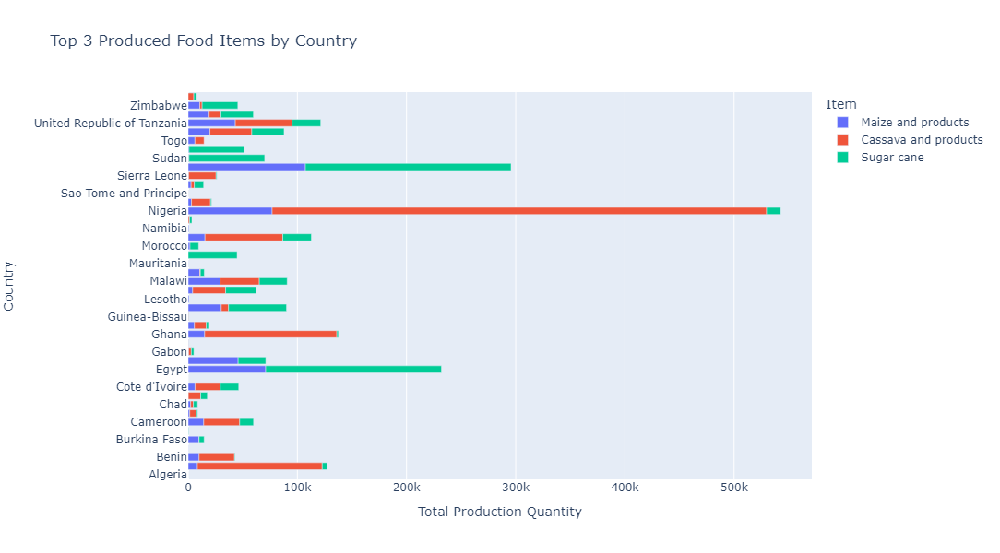

<Figure size 1400x800 with 0 Axes>

In [41]:
plt.figure(figsize = (14, 8))
fig = px.bar(
    top_food_by_country,
    x='Value',
    y='Country',
    color='Item',
    orientation='h',  # Set orientation to horizontal
    title='Top 3 Produced Food Items by Country',
    labels={'Value': 'Total Production Quantity', 'Country': 'Country', 'Item': 'Item'}
)

# Update layout for better readability
fig.update_layout(
    xaxis_title='Total Production Quantity',
    yaxis_title='Country',
    legend_title_text='Item',
    width=1000,
    height=600
)

# Show the interactive plot
fig.show()

In [ ]:
# The countries producing the top 3 food items (Cassava, sugar cane and maize), include Nigeria, South Africa and Egypt, 

In [51]:
wheat = afri_prod[afri_prod['Item'] == 'Wheat and products']
wheat

,Country,Item,Year,Value,Unit
0,Algeria,Wheat and products,2004,2731,kt
1,Algeria,Wheat and products,2005,2415,kt
2,Algeria,Wheat and products,2006,2688,kt
3,Algeria,Wheat and products,2007,2319,kt
4,Algeria,Wheat and products,2008,1111,kt
...,...,...,...,...,...
22475,Zimbabwe,Wheat and products,2009,12,kt
22476,Zimbabwe,Wheat and products,2010,18,kt
22477,Zimbabwe,Wheat and products,2011,23,kt
22478,Zimbabwe,Wheat and products,2012,20,kt


In [43]:
# What country produced the highest oats in 2010

oats_in_2010 = afri_prod[(afri_prod['Year'] == 2010) & (afri_prod['Item'] == 'Oats')]
highest_oats_2010 = oats_in_2010.loc[oats_in_2010['Value'].idxmax()]
highest_oats_2010

Country    Algeria
Item          Oats
Year          2010
Value           88
Unit            kt
Name: 46, dtype: object

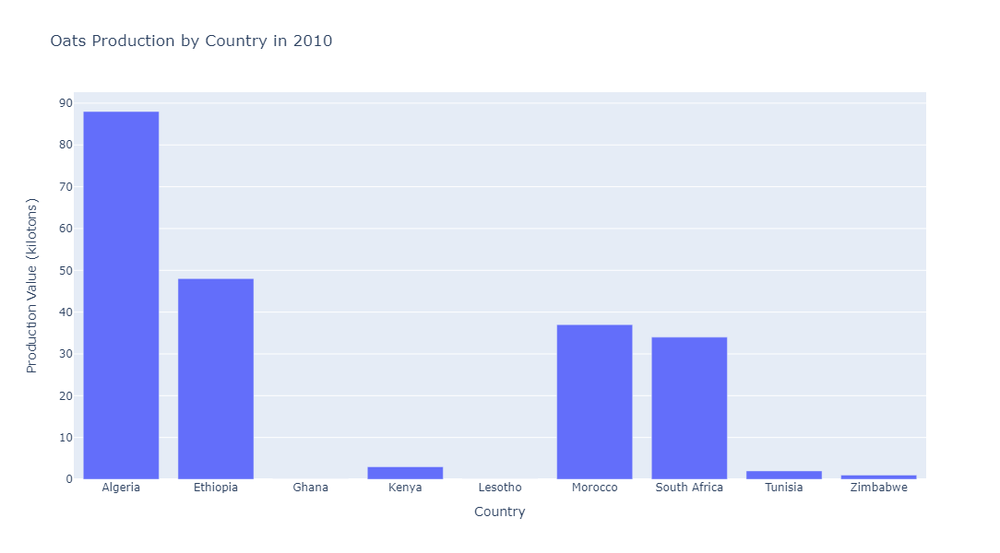

In [44]:
# Plot the data using seaborn
fig = px.bar(
    oats_in_2010,
    x='Country',
    y='Value',
    title='Oats Production by Country in 2010',
    labels={'Value': 'Production Value (kilotons)', 'Country': 'Country'}
)

fig.update_layout(
    xaxis_title='Country',
    yaxis_title='Production Value (kilotons)',
    width=1000,
    height=600
)

fig.show()

In [ ]:
# What food items were produced the least during 2004 to 2013 in Africa?

In [80]:
least_50 = pd.DataFrame(afri_prod.groupby('Item')['Value'].sum().sort_values(ascending = True)).reset_index()[:50]
least_50

,Item,Value
0,"Aquatic Animals, Others",13
1,"Fish, Liver Oil",28
2,Pepper,199
3,"Molluscs, Other",214
4,Cloves,249
5,"Fish, Body Oil",403
6,Cream,413
7,Rape and Mustard Oil,437
8,Sugar non-centrifugal,686
9,Rye and products,846


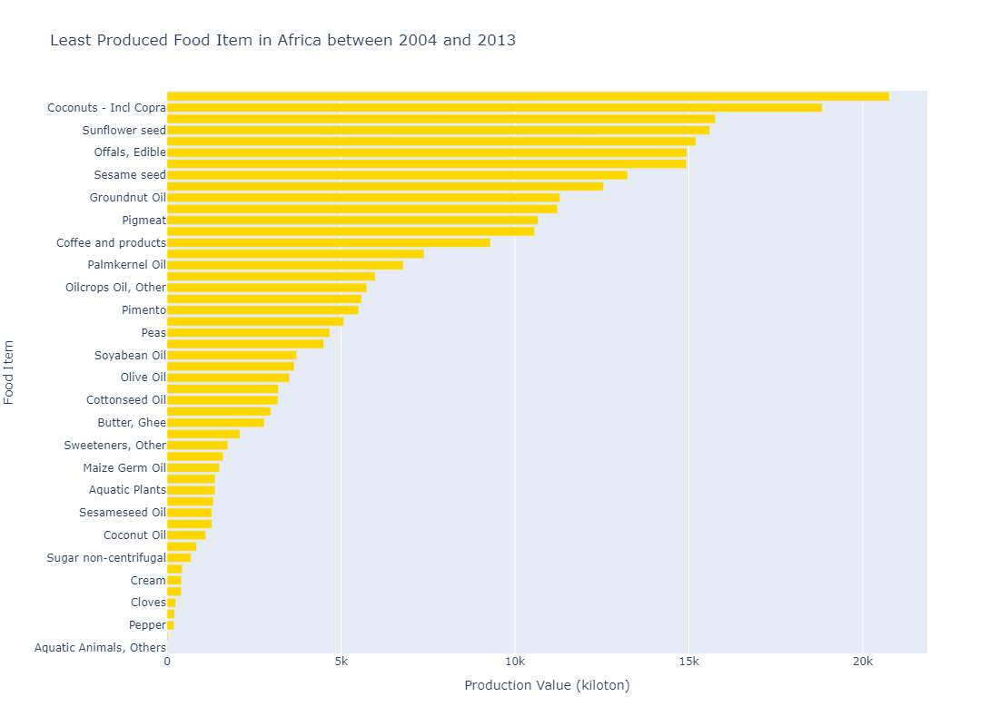

In [83]:
# Visualizing the least food production in Africa

fig = px.bar(
    least_50,
    x='Value',
    y='Item',
    title='Least Produced Food Item in Africa between 2004 and 2013',
    labels={'Value': 'Production Value (kiloton)', 'Item': 'Food Item'},
    orientation='h',
    color_discrete_sequence=['#FFD700'] 
)

fig.update_layout(
    xaxis_title='Production Value (kiloton)',
    yaxis_title='Food Item',
    width=1000,
    height=800
)

fig.show()

# plt.style.use("ggplot")
# plt.rc('font', size=15)
# plt.rc('xtick', labelsize=20) 
# plt.rc('ytick', labelsize=20)

# # create a pandas dataframe with the Item and Values coulmns

# plt.rcParams['figure.figsize'] = (20, 15)
# sns.barplot(y = least_50.Item, x = least_50.Value, data = least_50, color = 'y')
# plt.gca().set_title("Least Produced Food Item in Africa between 2004 and 2013")
# plt.ylabel('Production Value (kiloton)')
# plt.xlabel('Food Item')
# plt.xticks(rotation = 90)
# plt.show()

In [ ]:
# Highest food production per year

# What food is the highest produced food item per year in Africa?

In [108]:
max_food_per_year = afri_prod.loc[afri_prod.groupby('Year')['Value'].idxmax()]
max_food_per_year

,Country,Item,Year,Value,Unit
15440,Nigeria,Cassava and products,2004,38845,kt
15441,Nigeria,Cassava and products,2005,41565,kt
15442,Nigeria,Cassava and products,2006,45721,kt
15443,Nigeria,Cassava and products,2007,43410,kt
15444,Nigeria,Cassava and products,2008,44582,kt
15445,Nigeria,Cassava and products,2009,36822,kt
15446,Nigeria,Cassava and products,2010,42533,kt
15447,Nigeria,Cassava and products,2011,52403,kt
15448,Nigeria,Cassava and products,2012,54000,kt
15449,Nigeria,Cassava and products,2013,53000,kt


In [120]:
# Which country produced the highest quantity of each food_item per year?

highest_prod_country_yearly = afri_prod.loc[afri_prod.groupby(['Year', 'Item'])['Value'].idxmax()]
highest_prod_country_yearly

,Country,Item,Year,Value,Unit
18280,South Africa,"Alcohol, Non-Food",2004,175,kt
18180,South Africa,Apples and products,2004,765,kt
11310,Madagascar,"Aquatic Animals, Others",2004,1,kt
21980,United Republic of Tanzania,Aquatic Plants,2004,75,kt
21630,United Republic of Tanzania,Bananas,2004,2489,kt
...,...,...,...,...,...
5979,Egypt,Tomatoes and products,2013,8291,kt
15719,Nigeria,"Vegetables, Other",2013,9039,kt
5669,Egypt,Wheat and products,2013,9460,kt
18249,South Africa,Wine,2013,1098,kt


In [124]:
nigeria = highest_prod_country_yearly[highest_prod_country_yearly['Country'] == 'Nigeria']
nigeria

,Country,Item,Year,Value,Unit
15810,Nigeria,"Beverages, Fermented",2004,9137,kt
15440,Nigeria,Cassava and products,2004,38845,kt
15720,Nigeria,"Citrus, Other",2004,3996,kt
15960,Nigeria,Crustaceans,2004,29,kt
15900,Nigeria,Eggs,2004,476,kt
...,...,...,...,...,...
15529,Nigeria,"Pulses, Other and products",2013,3014,kt
15429,Nigeria,Sorghum and products,2013,6700,kt
15799,Nigeria,"Spices, Other",2013,166,kt
15719,Nigeria,"Vegetables, Other",2013,9039,kt


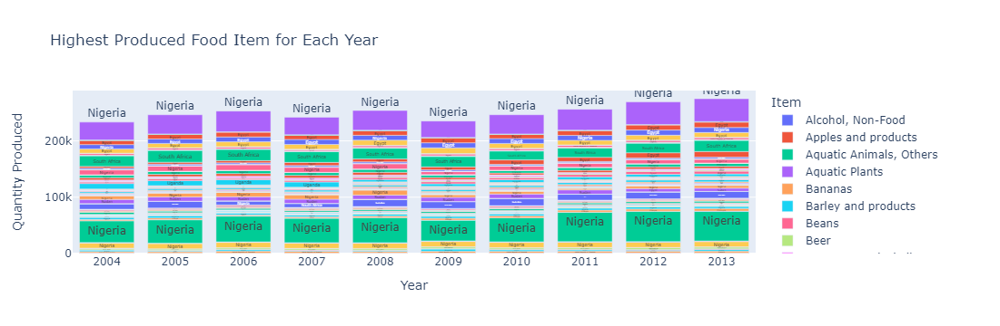

In [121]:
# Visualizing which country produced the highest quantity of each food item per year?

fig = px.bar(
    highest_prod_country_yearly,
    x='Year',
    y='Value',
    color='Item',
    text = 'Country',
    title='Highest Produced Food Item for Each Year',
    labels={'Country': 'Country', 'Value': 'Quantity Produced', 'Year': 'Year'}
)

fig.update_traces(textposition='outside')
fig.update_layout(xaxis=dict(type='category'))

fig.show()

In [ ]:
# Which food item experience significant increase in production between 2004 and 2013?

In [128]:
# Checking for production trend

food_prod_trend = afri_prod.groupby(['Year', 'Item'])['Value'].sum().unstack().diff().mean().idxmax()
food_prod_trend

'Cassava and products'

In [133]:
# How has cassava and products production changed between 2004 and 2013?

prod_trend = afri_prod[afri_prod['Item'] == 'Cassava and products']
prod_trend_yearly = prod_trend.groupby('Year')['Value'].sum().reset_index()
# afri_prod.groupby(['Year', 'Item'])['Value'].sum().unstack().diff().mean().idxmax()
# highest_prod_country_yearly[highest_prod_country_yearly['Country'] == 'Nigeria']

In [141]:
# visualizing cassava and products production trend between 2004 and 2013

chart = alt.Chart(prod_trend_yearly).mark_line(point=True).encode(
    x=alt.X('Year:O', title='Year'),
    y=alt.Y('Value:Q', title='Total Production Value (in kilotons)'),
    tooltip=['Year', 'Value']
).properties(
    title='Trend of Cassava Production Over the Years',
    width=800,  
    height=400
).interactive()

chart.show()

alt.Chart(...)

In [ ]:
# Cassava and products production has seen a steady increase over the time period of the dataset. Although, production was quite stable (constant)
# between 2006 to 2009, before increasing significantly from 2009.

In [84]:
# importing the supply data

afri_supply = pd.read_csv("C:/Users/ADONAI-MKSHALOM/Desktop/Pola/DA\Hamoye/Africa_Food_Supply.csv")

In [85]:
afri_supply.head()

,Country,Year,Value
0,Algeria,2004,2987
1,Algeria,2005,2958
2,Algeria,2006,3047
3,Algeria,2007,3041
4,Algeria,2008,3048


In [85]:
afri_supply.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 450 entries, 0 to 449
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Country  450 non-null    object
 1   Year     450 non-null    int64 
 2   Value    450 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 10.7+ KB


In [86]:
afri_supply['Year'] = pd.to_datetime(afri_supply.Year, format = '%Y').dt.year
afri_supply['Unit'] = 'kcal/person/day'

In [87]:
afri_supply.dtypes

Country    object
Year        int32
Value       int64
Unit       object
dtype: object

In [88]:
afri_prod.shape

(23110, 5)

In [89]:
afri_supply.shape

(450, 4)

In [90]:
country_supply = afri_supply.groupby(['Country', 'Year'])['Value'].sum()

In [91]:
country_supply

Country   Year
Algeria   2004    2987
          2005    2958
          2006    3047
          2007    3041
          2008    3048
                  ... 
Zimbabwe  2009    2147
          2010    2168
          2011    2200
          2012    2197
          2013    2110
Name: Value, Length: 450, dtype: int64

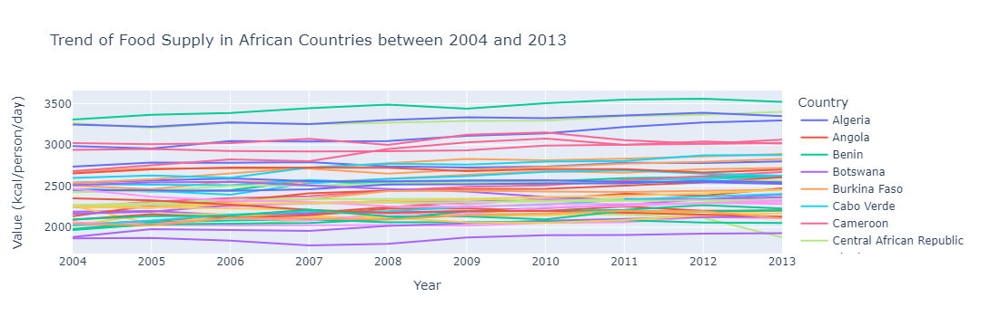

<Figure size 2000x1000 with 0 Axes>

In [92]:
# Line plot showing the food supply in Africa over the years per country

plt.figure(figsize = (20,10))
food_supply_graph = px.line(afri_supply, x = afri_supply['Year'],y = afri_supply['Value'],
                          color = afri_supply['Country'],
                          hover_name =afri_supply['Value'],
                          title = 'Trend of Food Supply in African Countries between 2004 and 2013',
                          labels = {'Year': 'Year', 'Value':'Value (kcal/person/day)'}                
)
food_supply_graph

In [ ]:
# The top 3 countries with food supply are Egypt, Tunisia, Morocco

Text(0.5, 0, 'Year')

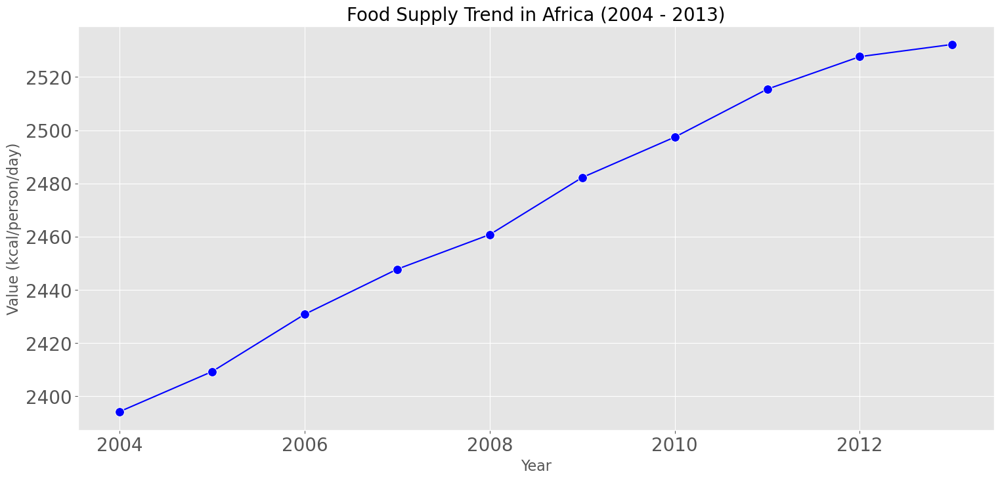

In [90]:
# visualizing the food supply trend over time with line plot
plt.figure(figsize=[18,8])

#set label sizes for axes, xtick and ytick
plt.rc('font', size=15)
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)

sns.lineplot(data = afri_supply, x = "Year", y = "Value", marker = 'o', markersize = 10, ci = None, color = 'b')
plt.title("Food Supply Trend in Africa (2004 - 2013)", fontsize=20)
plt.ylabel('Value (kcal/person/day)', fontsize = 16)
plt.xlabel('Year', fontsize=16)

In [93]:
# Using altair - boxplot to view the outliers in our supply data 

alt.Chart(afri_supply).mark_boxplot().encode(
    x=alt.X('Year:O', title='Year', axis=alt.Axis(labelAngle=45)),
    y=alt.Y('Value:Q', title='Consumption Value'),
    color=alt.Color('Year:O', scale=alt.Scale(scheme='viridis')),
).properties(
    width=1000,
    height=400,
    title='Food Consumption in Africa between 2004 and 2013'
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
).configure_title(
    fontSize=16
)

alt.Chart(...)